In [9]:
from typing import Dict, Tuple
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
from IPython.display import HTML
from utils.diffusion_utilities import *

# NN

In [10]:
# NN for sampling

class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat=256, n_cfeat=10, height=28):  # cfeat - context features
        super(ContextUnet, self).__init__()

        # number of input channels, number of intermediate feature maps and number of classes
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height  #assume h == w. must be divisible by 4, so 28,24,20,16...

        # Initialize the initial convolutional layer
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # Initialize the down-sampling path of the U-Net with two levels
        self.down1 = UnetDown(n_feat, n_feat)        # down1 #[10, 256, 8, 8]
        self.down2 = UnetDown(n_feat, 2 * n_feat)    # down2 #[10, 256, 4,  4]
        
         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        # Embed the timestep and context labels with a one-layer fully connected neural network
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

        # Initialize the up-sampling path of the U-Net with three levels
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4), # up-sample  
            nn.GroupNorm(8, 2 * n_feat), # normalize                       
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # Initialize the final convolutional layers to map to the same number of channels as the input image
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), # reduce number of feature maps   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_feat), # normalize
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), # map to same number of channels as input
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_feat, h, w) : input image
        t : (batch, n_cfeat)      : time step
        c : (batch, n_classes)    : context label
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on

        # pass the input image through the initial convolutional layer
        x = self.init_conv(x)
        # pass the result through the down-sampling path
        down1 = self.down1(x)       #[10, 256, 8, 8]
        down2 = self.down2(down1)   #[10, 256, 4, 4]
        
        # convert the feature maps to a vector and apply an activation
        hiddenvec = self.to_vec(down2)
        
        # mask out context if context_mask == 1
        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x)
            
        # embed context and timestep
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)     # (batch, 2*n_feat, 1,1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)
        #print(f"uunet forward: cemb1 {cemb1.shape}. temb1 {temb1.shape}, cemb2 {cemb2.shape}. temb2 {temb2.shape}")


        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1 + temb1, down2)  # add and multiply embeddings
        up3 = self.up2(cemb2*up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out


# Inputs

In [17]:
# Hyperparameters

# - diffusion hyperparameters
timesteps = 500
beta1 = 1e-4    # for DDPM (Denoising Diffusion Probabilistic Model)
beta2 = 0.02    # for DDPM

# - network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
n_feat = 64 # 64 hidden dimension feature
n_cfeat = 5 # context vector is of size 5
height = 16 # 16x16 image
save_dir = '../weights/'

# Sampling - DDPM

In [12]:
# Construct DDPM noise schedule
# - i.e. what level of noise to apply to an image at a certain time step
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()    
ab_t[0] = 1

In [13]:
# Construct model
nn_model = ContextUnet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

In [14]:
# Function to remove the predicted noise 
# - but adds some noise back in to avoid collapse
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)
    # Scale 'extra' noise (not from NN) by some factor
    noise = b_t.sqrt()[t] * z
    # Remove noise (predicted by NN) from image
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()
    # Add 'extra' noise (not from NN) back to ensure that noise in sample is 
    # normally distributed (to avoid inferencecollapse)
    return mean + noise

In [20]:
# sample using either standard algorithm or including context
@torch.no_grad()
def sample_ddpm(n_sample, context=False, save_rate=20):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, 3, height, height).to(device)  

    # array to keep track of generated steps for plotting
    intermediate = [] 
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # sample some random noise to inject back in. For i = 1, don't add back in noise
        z = torch.randn_like(samples) if i > 1 else 0

        if context is not False:
            # predict noise e_(x_t,t, ctx)
            eps = nn_model(samples, t, c=context) 
        else:
            # predict noise e_(x_t,t)
            eps = nn_model(samples, t)  
 
        # Subtract predicted noise from image & add some noise back in to avoid collapse  
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate ==0 or i==timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

# Inference: pretrained model

In [21]:
# Load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/model_trained.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [22]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

### Test - inference without adding extra noise to sample

In [ ]:
# incorrectly sample without adding in noise
@torch.no_grad()
def sample_ddpm_incorrect(n_sample):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, 3, height, height).to(device)  

    # array to keep track of generated steps for plotting
    intermediate = [] 
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # don't add back in noise
        z = 0

        eps = nn_model(samples, t)    # predict noise e_(x_t,t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i%20==0 or i==timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [ ]:
# visualize samples
plt.clf()
samples, intermediate = sample_ddpm_incorrect(32)
animation = plot_sample(intermediate,32,4,save_dir, "ani_run", None, save=False)
HTML(animation.to_jshtml())

# Training

In [18]:
# Training hyperparameters
batch_size = 100
n_epoch = 32
lrate=1e-3

In [19]:
# Load dataset and construct optimizer
dataset = CustomDataset("data_train/sprites_1788_16x16.npy", "data_train/sprite_labels_nc_1788_16x16.npy", transform, null_context=False)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)

sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)


In [20]:
# Perturb an image to a specified noise level
def perturb_input(x, t, noise):
    return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]) * noise

### Visualise train dataset

In [21]:
sprites = np.load("data_train/sprites_1788_16x16.npy")

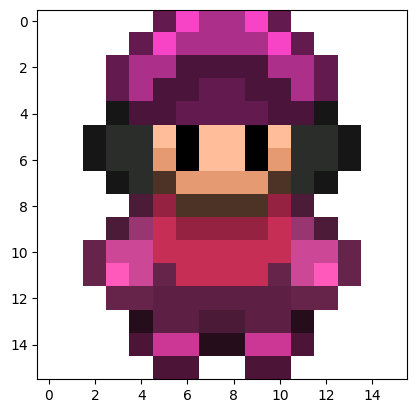

In [22]:
plt.imshow(sprites[0,...])

### Train script WITHOUT context

In [23]:
# # training without context code

# # set into train mode
# nn_model.train()

# for ep in range(n_epoch):
#     print(f'epoch {ep}')
    
#     # linearly decay learning rate
#     optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)
    
#     pbar = tqdm(dataloader, mininterval=2 )
#     for x, _ in pbar:   # x: images
#         optim.zero_grad()
#         x = x.to(device)
        
#         # perturb data
#         noise = torch.randn_like(x)
#         t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device) 
#         x_pert = perturb_input(x, t, noise)
        
#         # use network to recover noise
#         pred_noise = nn_model(x_pert, t / timesteps)
        
#         # loss is mean squared error between the predicted and true noise
#         loss = F.mse_loss(pred_noise, noise)
#         loss.backward()
        
#         optim.step()

#     # save model periodically
#     if ep%4==0 or ep == int(n_epoch-1):
#         if not os.path.exists(save_dir):
#             os.mkdir(save_dir)
#         torch.save(nn_model.state_dict(), save_dir + f"model_{ep}.pth")
#         print('saved model at ' + save_dir + f"model_{ep}.pth")

#### Check epoch 0

In [24]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/model_0.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [27]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

### Train script WITH context

In [ ]:
# # training with context code
# # set into train mode
# nn_model.train()

# for ep in range(n_epoch):
#     print(f'epoch {ep}')
    
#     # linearly decay learning rate
#     optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)
    
#     pbar = tqdm(dataloader, mininterval=2 )
#     for x, c in pbar:   # x: images  c: context (one hot encoding vecotrs)
#         optim.zero_grad()
#         x = x.to(device)
#         c = c.to(x)
        
#         # randomly mask out c
#         context_mask = torch.bernoulli(torch.zeros(c.shape[0]) + 0.9).to(device)
#         # - with some randomness, we completely mask out the context so that 
#         #   the model is able to generally learn what a sprite is as well
#         c = c * context_mask.unsqueeze(-1)
        
#         # perturb data
#         noise = torch.randn_like(x)
#         t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device) 
#         x_pert = perturb_input(x, t, noise)
        
#         # use network to recover noise
#         pred_noise = nn_model(x_pert, t / timesteps, c=c)
        
#         # loss is mean squared error between the predicted and true noise
#         loss = F.mse_loss(pred_noise, noise)
#         loss.backward()
        
#         optim.step()

#     # save model periodically
#     if ep%4==0 or ep == int(n_epoch-1):
#         if not os.path.exists(save_dir):
#             os.mkdir(save_dir)
#         torch.save(nn_model.state_dict(), save_dir + f"context_model_{ep}.pth")
#         print('saved model at ' + save_dir + f"context_model_{ep}.pth")

#### Check pretrained model with context

In [44]:
# load in pretrain model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/context_model_trained.pth", map_location=device))
nn_model.eval() 
print("Loaded in Context Model")

Loaded in Context Model


In [45]:
# visualize samples with randomly selected context
plt.clf()
# - create 32 one hot encodings of length 5
ctx = F.one_hot(torch.randint(0, 5, (32,)), 5).to(device=device).float()
# - inference
samples, intermediate = sample_ddpm(32, context=ctx)
animation_ddpm_context = plot_sample(intermediate,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm_context.to_jshtml())

<Figure size 640x480 with 0 Axes>

#### Play around with context vector

In [54]:
def show_images(imgs, nrow=2):
    _, axs = plt.subplots(nrow, imgs.shape[0] // nrow, figsize=(4,2 ))
    axs = axs.flatten()
    for img, ax in zip(imgs, axs):
        img = (img.permute(1, 2, 0).clip(-1, 1).detach().cpu().numpy() + 1) / 2
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(img)
    plt.show()

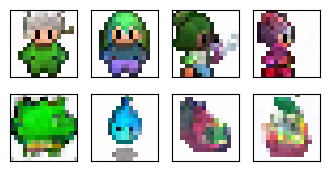

In [55]:
# user defined context
ctx = torch.tensor([
    # hero, non-hero, food, spell, side-facing
    [1,0,0,0,0],  
    [1,0,0,0,0],    
    [0,0,0,0,1],
    [0,0,0,0,1],    
    [0,1,0,0,0],
    [0,1,0,0,0],
    [0,0,1,0,0],
    [0,0,1,0,0],
]).float().to(device)
samples, _ = sample_ddpm(ctx.shape[0], context=ctx)
show_images(samples)

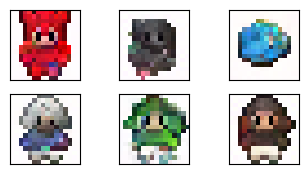

In [56]:
# mix of defined context
ctx = torch.tensor([
    # hero, non-hero, food, spell, side-facing
    [1,0,0,0,0],      #human
    [1,0,0.6,0,0],    
    [0,0,0.6,0.4,0],  
    [1,0,0,0,1],  
    [1,1,0,0,0],
    [1,0,0,1,0]
]).float().to(device)
samples, _ = sample_ddpm(ctx.shape[0], context=ctx)
show_images(samples)

# Sampling - DDIM

In [57]:
# Define sampling function for DDIM   
# - removes the noise using ddim
def denoise_ddim(x, t, t_prev, pred_noise):
    ab = ab_t[t]
    ab_prev = ab_t[t_prev]
    
    x0_pred = ab_prev.sqrt() / ab.sqrt() * (x - (1 - ab).sqrt() * pred_noise)
    dir_xt = (1 - ab_prev).sqrt() * pred_noise

    return x0_pred + dir_xt

In [63]:
# Quick sample with DDIM (without or with context)
@torch.no_grad()
def sample_ddim(n_sample, context=False, n=20):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, 3, height, height).to(device)  

    # array to keep track of generated steps for plotting
    intermediate = [] 
    # Skip timesteps with DDIM (would run through all with DDPM)
    step_size = timesteps // n
    for i in range(timesteps, 0, -step_size):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        if a is not False:
            # predict noise e_(x_t,t,ctx)
            eps = nn_model(samples, t, c=context)  
        else:
            # predict noise e_(x_t,t)
            eps = nn_model(samples, t)    
            
        samples = denoise_ddim(samples, i, i - step_size, eps)
        intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate


# REF - sampling with DDPM --------------------------------------------------------------

# # sample using either standard algorithm or including context
# @torch.no_grad()
# def sample_ddpm(n_sample, context=False, save_rate=20):
#     # x_T ~ N(0, 1), sample initial noise
#     samples = torch.randn(n_sample, 3, height, height).to(device)  

#     # array to keep track of generated steps for plotting
#     intermediate = [] 
#     for i in range(timesteps, 0, -1):
#         print(f'sampling timestep {i:3d}', end='\r')

#         # reshape time tensor
#         t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

#         # sample some random noise to inject back in. For i = 1, don't add back in noise
#         z = torch.randn_like(samples) if i > 1 else 0

#         if a is not False:
#             # predict noise e_(x_t,t)
#             eps = nn_model(samples, t)  
#         else:
#             # predict noise e_(x_t,t, ctx)
#             eps = nn_model(samples, t, c=context)   
 
#         # Subtract predicted noise from image & add some noise back in to avoid collapse  
#         samples = denoise_add_noise(samples, i, eps, z)
#         if i % save_rate ==0 or i==timesteps or i<8:
#             intermediate.append(samples.detach().cpu().numpy())

#     intermediate = np.stack(intermediate)
#     return samples, intermediate

## Inference: without context

In [64]:
# Load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/model_ddim_31.pth", map_location=device))
nn_model.eval() 
print("Loaded in Model without context")

Loaded in Model without context


In [65]:
# visualize samples
plt.clf()
samples, intermediate = sample_ddim(32, n=25)
animation_ddim = plot_sample(intermediate,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddim.to_jshtml())

<Figure size 640x480 with 0 Axes>

## Inference: with context

In [67]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/context_model_ddim_31.pth", map_location=device))
nn_model.eval() 
print("Loaded in Context Model")

Loaded in Context Model


In [69]:
# visualize samples
plt.clf()
ctx = F.one_hot(torch.randint(0, 5, (32,)), 5).to(device=device).float()
samples, intermediate = sample_ddim(32, context=ctx)
animation_ddpm_context = plot_sample(intermediate,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm_context.to_jshtml())

<Figure size 640x480 with 0 Axes>